In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

In [54]:
# чтение датасета
fish = pd.read_csv('fish_data.csv', index_col='id')
fish

,average_length(inches)),average_weight(inches)),habitat,ph_of_water,color,Gender,life_span
id,,,,,,,
1,14.69,5.87,ponds,6.2,Reddish_Orange,False,10.9
2,1.32,3.86,idlewater,6.8,Calico,True,5.2
3,14.23,12.09,lakes,7.9,Reddish_Orange,True,25.3
4,2.54,3.20,rivers,6.7,White,False,16.4
5,13.10,9.81,lakes,7.8,Orange,True,3.2
...,...,...,...,...,...,...,...
1996,16.12,6.46,ponds,8.0,Red_and_White_Bi_Color,NaN,6.4
1997,7.50,7.07,rivers,6.3,Black_and_Orange,True,14.0
1998,10.52,3.27,slowmovingwaters,6.1,Orange,True,13.1


In [52]:
fish.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 1 to 2000
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   average_length(inches))  2000 non-null   float64
 1   average_weight(inches))  2000 non-null   float64
 2   habitat                  2000 non-null   object 
 3   ph_of_water              2000 non-null   float64
 4   color                    2000 non-null   object 
 5   Gender                   1976 non-null   float64
 6   life_span                2000 non-null   float64
dtypes: float64(5), object(2)
memory usage: 125.0+ KB


Анализируется датасет о продолжительности жизни золотых рыбок. 
Представлена следующая информация:
- длина рыбки, дюйм (числовое значение, ср. значение 10,5 дюймов)
- вес рыбки, унции (числовое значение, ср. значение 10,4 унции)
- среда обитания (текстовое значение)
- ph воды (числовое значение, ср. значение 7)
- цвет рыбки (текстовое значение)
- пол (текстовое значение значение: False - женский пол, True - мужский пол)
- продолжительность жизни (числовое значение, ср. значение 14)


In [55]:
# 1 - female, 0 - male
gender_map = {False: 1, True: 0}
fish['Gender'] = fish['Gender'].map(gender_map)
fish

,average_length(inches)),average_weight(inches)),habitat,ph_of_water,color,Gender,life_span
id,,,,,,,
1,14.69,5.87,ponds,6.2,Reddish_Orange,1.0,10.9
2,1.32,3.86,idlewater,6.8,Calico,0.0,5.2
3,14.23,12.09,lakes,7.9,Reddish_Orange,0.0,25.3
4,2.54,3.20,rivers,6.7,White,1.0,16.4
5,13.10,9.81,lakes,7.8,Orange,0.0,3.2
...,...,...,...,...,...,...,...
1996,16.12,6.46,ponds,8.0,Red_and_White_Bi_Color,NaN,6.4
1997,7.50,7.07,rivers,6.3,Black_and_Orange,0.0,14.0
1998,10.52,3.27,slowmovingwaters,6.1,Orange,0.0,13.1


In [56]:
fish.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000 entries, 1 to 2000
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   average_length(inches))  2000 non-null   float64
 1   average_weight(inches))  2000 non-null   float64
 2   habitat                  2000 non-null   object 
 3   ph_of_water              2000 non-null   float64
 4   color                    2000 non-null   object 
 5   Gender                   1976 non-null   float64
 6   life_span                2000 non-null   float64
dtypes: float64(5), object(2)
memory usage: 125.0+ KB


In [57]:
# Проверка на пропущенные значения
fish.isnull().sum()

average_length(inches))     0
average_weight(inches))     0
habitat                     0
ph_of_water                 0
color                       0
Gender                     24
life_span                   0
dtype: int64

In [58]:
# Базовая статистика
fish.describe()

,average_length(inches)),average_weight(inches)),ph_of_water,Gender,life_span
count,2000.000000,2000.000000,2000.00000,1976.000000,2000.000000
mean,10.557110,10.449445,7.01495,0.509615,14.371500
std,5.521147,4.885487,0.57745,0.500034,7.705953
min,1.000000,2.000000,6.00000,0.000000,1.000000
25%,5.857500,6.137500,6.50000,0.000000,7.800000
50%,10.660000,10.455000,7.00000,1.000000,14.400000
75%,15.172500,14.665000,7.50000,1.000000,20.900000
max,20.000000,18.960000,8.00000,1.000000,28.000000


In [59]:
# Категориальные значения в столбце Среда обитания
fish.value_counts('habitat')

habitat
lakes               418
ponds               406
slowmovingwaters    396
rivers              395
idlewater           385
dtype: int64

In [60]:
# Замена категориального признака Среда обитания
habitat_map = {'lakes': 1, 'ponds': 2, 'slowmovingwaters': 3, 'rivers': 4, 'idlewater': 5}
fish['habitat'] = fish['habitat'].map(habitat_map)
fish

,average_length(inches)),average_weight(inches)),habitat,ph_of_water,color,Gender,life_span
id,,,,,,,
1,14.69,5.87,2,6.2,Reddish_Orange,1.0,10.9
2,1.32,3.86,5,6.8,Calico,0.0,5.2
3,14.23,12.09,1,7.9,Reddish_Orange,0.0,25.3
4,2.54,3.20,4,6.7,White,1.0,16.4
5,13.10,9.81,1,7.8,Orange,0.0,3.2
...,...,...,...,...,...,...,...
1996,16.12,6.46,2,8.0,Red_and_White_Bi_Color,NaN,6.4
1997,7.50,7.07,4,6.3,Black_and_Orange,0.0,14.0
1998,10.52,3.27,3,6.1,Orange,0.0,13.1


In [61]:
fish.value_counts('color')

color
Green_and_Chocolate       257
Yellow                    241
Orange                    240
Red_and_Silver            240
Black_and_Orange          217
Reddish_Orange            214
Calico                    209
Red_and_White_Bi_Color    192
White                     190
dtype: int64

In [62]:
# Замена категориального признака Среда обитания
color_map = {'Green_and_Chocolate': 1, 'Yellow': 2, 'Orange': 3, 'Red_and_Silver': 4, 'Black_and_Orange': 5, 'Reddish_Orange': 6, 'Calico': 7, 
             'Red_and_White_Bi_Color': 8, 'White': 9}
fish['color'] = fish['color'].map(color_map)
fish

,average_length(inches)),average_weight(inches)),habitat,ph_of_water,color,Gender,life_span
id,,,,,,,
1,14.69,5.87,2,6.2,6,1.0,10.9
2,1.32,3.86,5,6.8,7,0.0,5.2
3,14.23,12.09,1,7.9,6,0.0,25.3
4,2.54,3.20,4,6.7,9,1.0,16.4
5,13.10,9.81,1,7.8,3,0.0,3.2
...,...,...,...,...,...,...,...
1996,16.12,6.46,2,8.0,8,NaN,6.4
1997,7.50,7.07,4,6.3,5,0.0,14.0
1998,10.52,3.27,3,6.1,3,0.0,13.1


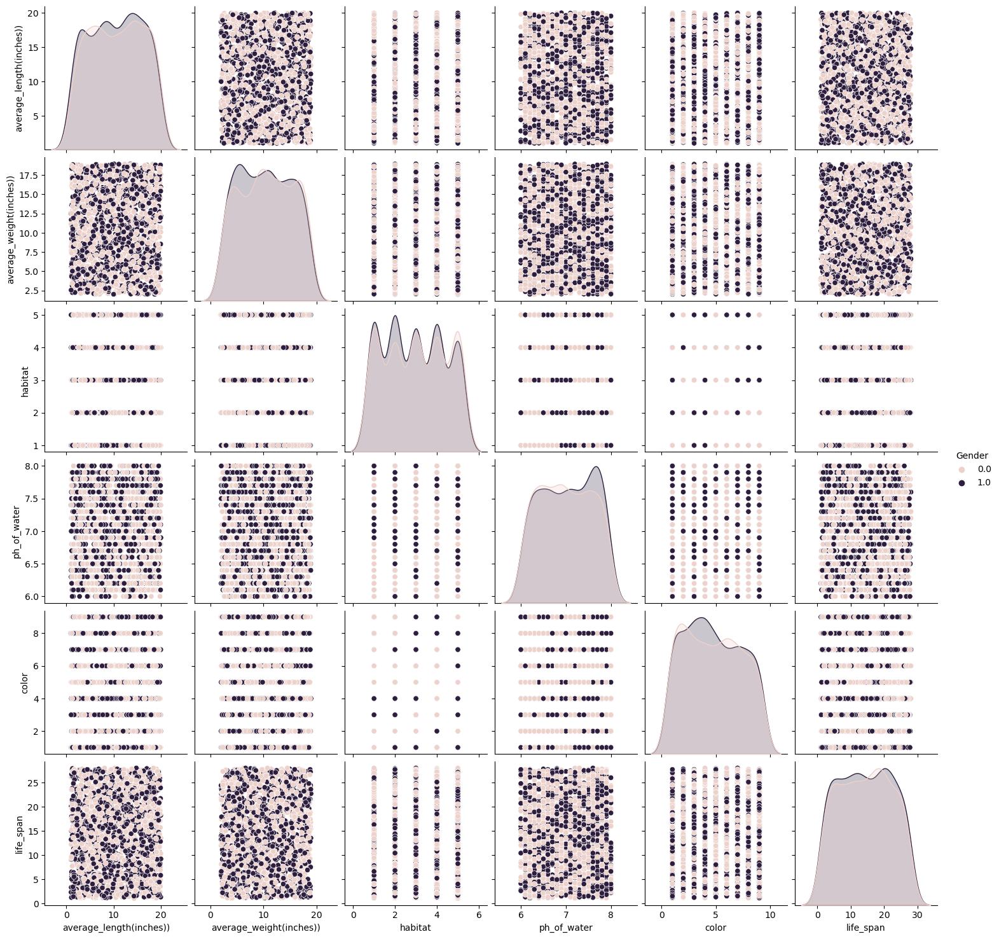

In [63]:
# Парные диаграммы рассеяния
sns.pairplot(fish, hue="Gender")
plt.show()

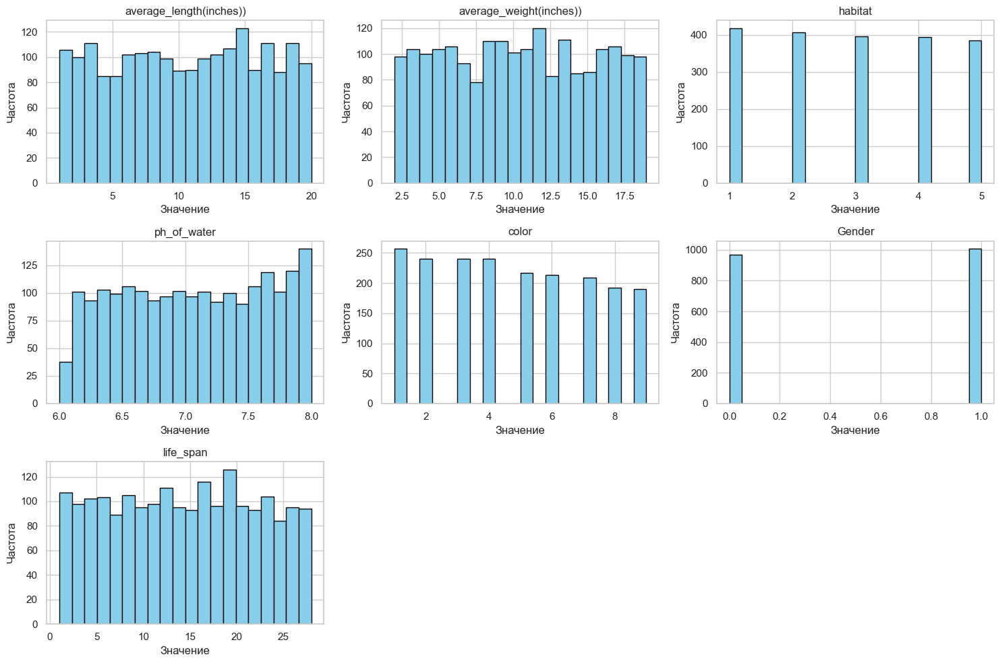

In [66]:
sns.set(style="whitegrid")
fish.hist(bins=20, figsize=(15, 10), color='skyblue', edgecolor='black')
for ax in plt.gcf().get_axes():
    ax.set_xlabel('Значение')
    ax.set_ylabel('Частота')
plt.tight_layout()
plt.show()

/Users/anastasianikisina/opt/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


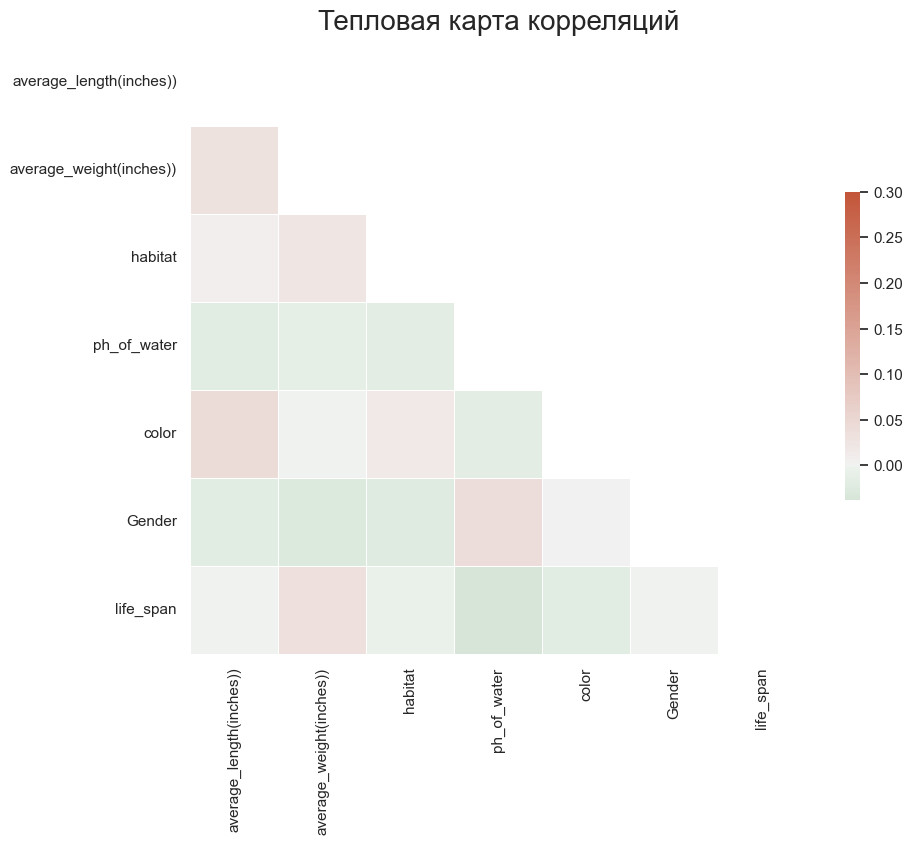

In [80]:
# тепловая карта корреляции
sns.set(style="white")
corr = fish.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(130, 20, as_cmap=True)
plt.figure(figsize=(10, 8))
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
plt.title('Тепловая карта корреляций', fontsize=20)
plt.show()

Зависимостей между переменными не наблюдается

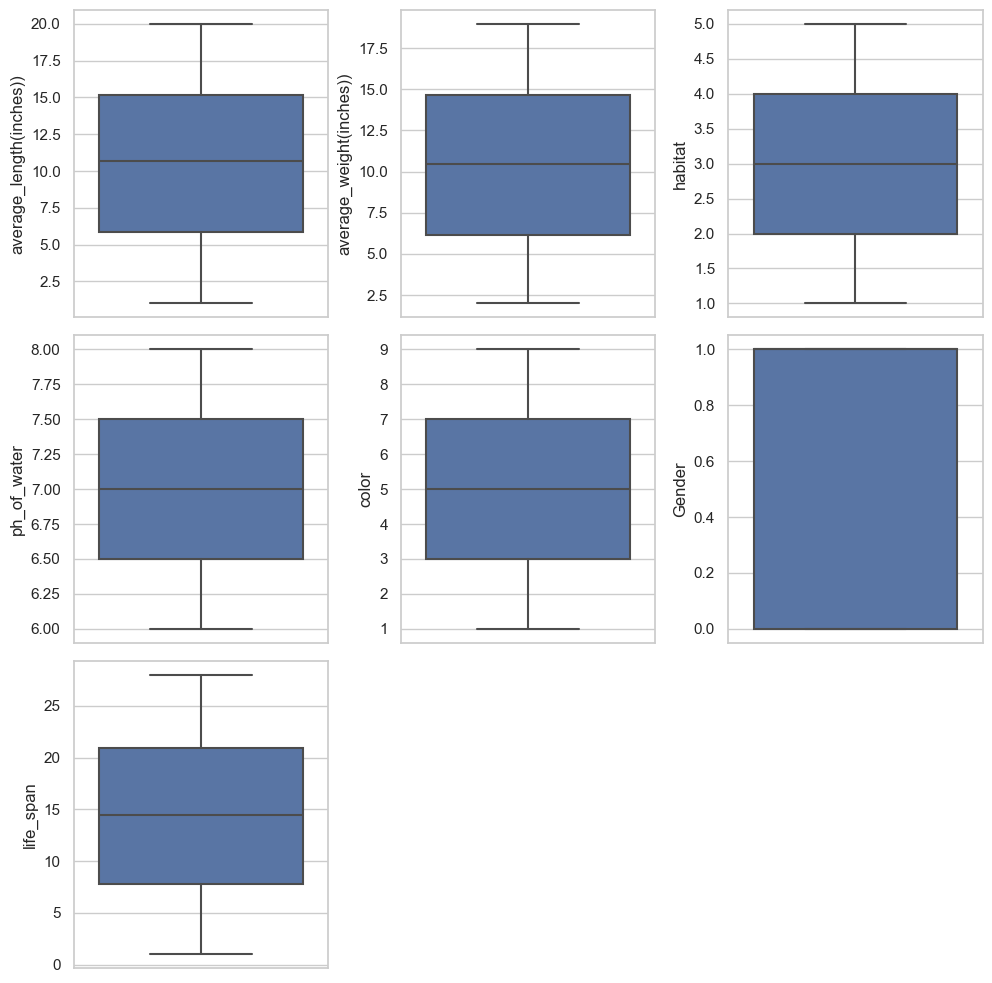

In [74]:
# Ящик с усами
import matplotlib.pyplot as plt
sns.set(style="whitegrid")
plt.figure(figsize=(10, 10))
for index, column in enumerate(fish.select_dtypes(include=[np.number]).columns):
    plt.subplot((len(fish.columns) // 3) + 1, 3, index + 1)
    sns.boxplot(y=fish[column])
plt.tight_layout()
plt.show()


Выбросов и аномалий в значениях нет

In [76]:
# Замена пустых значений
from data_processing import Data_processing
empty_fulfill = Data_processing
empty_fulfill.FulFill(fish)

Заменены пустые значения:
в столбце average_length(inches)) - медиана 10.66
в столбце average_weight(inches)) - медиана 10.455
в столбце habitat - медиана 3.0
в столбце ph_of_water - медиана 7.0
в столбце color - медиана 5.0
в столбце Gender - медиана 1.0
в столбце life_span - медиана 14.4


Регрессионный анализ:

In [85]:
# Разделение датасета на целевую переменную и фичи
features = fish.iloc[:, 1:-1].values
target = fish.loc[:, 'life_span'].values

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 1600, number of used features: 5
[LightGBM] [Info] Start training from score 14.453875
MAE_LGBM: 6.991762777862955
MSE_LGBM: 67.18787076753233
R²_LGBM: -0.19008240731689052


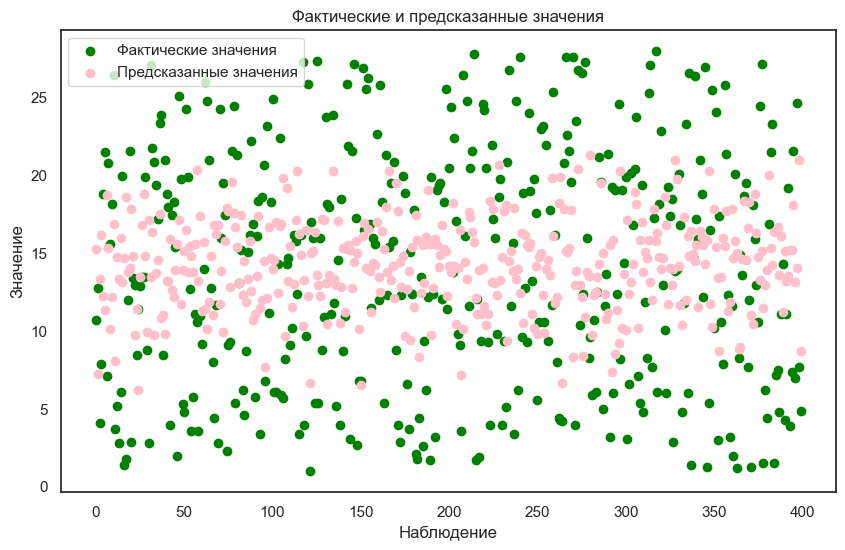

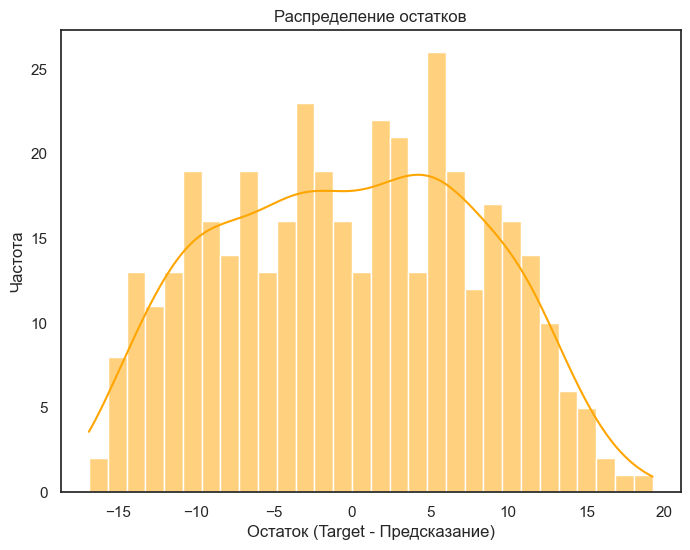

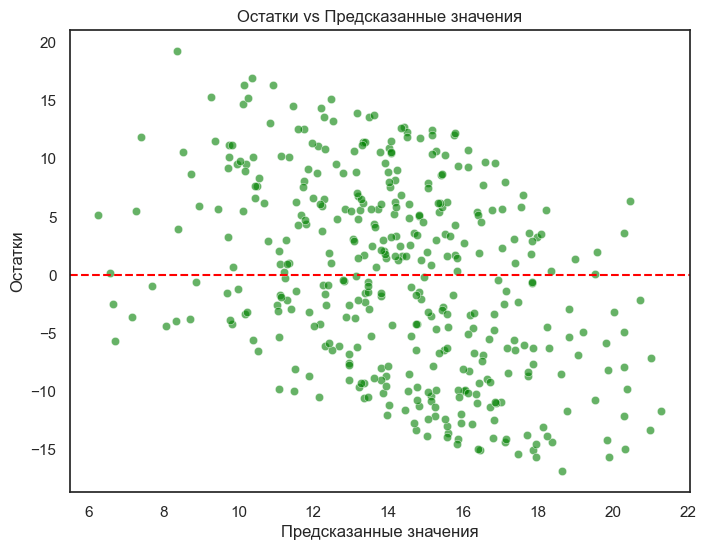

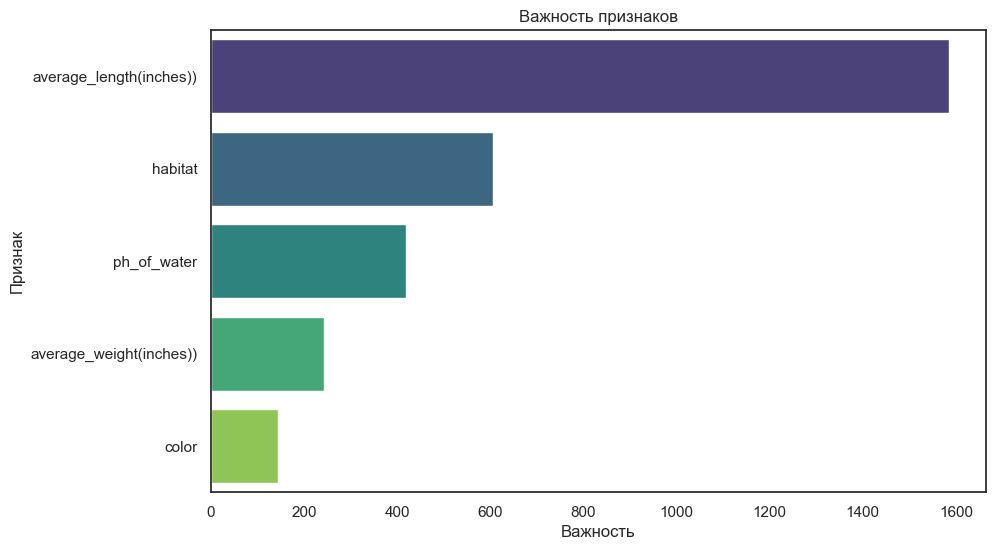

In [120]:
# Регрессор LGBM без определение параметров для подбора.
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Разделение данных на обучающую и тестовую выборки
X_train_LGBM, X_test_LGBM, y_train_LGBM, y_test_LGBM = train_test_split(features, target, test_size=0.2, random_state=42)

# Создание и обучение модели LGBMRegressor
model_LGBM = LGBMRegressor()
model_LGBM.fit(X_train_LGBM, y_train_LGBM)

# Предсказание на тестовой выборке
y_pred_LGBM = model_LGBM.predict(X_test_LGBM)

# Вычисление метрик
mae_LGBM = mean_absolute_error(y_test_LGBM, y_pred_LGBM)
mse_LGBM = mean_squared_error(y_test_LGBM, y_pred_LGBM)
r2_LGBM = r2_score(y_test_LGBM, y_pred_LGBM)

print(f'MAE_LGBM: {mae_LGBM}')
print(f'MSE_LGBM: {mse_LGBM}')
print(f'R²_LGBM: {r2_LGBM}')

# Визуализация предсказанных и фактических значений
plt.figure(figsize=(10, 6))
plt.scatter(range(len(y_test_LGBM)), y_test_LGBM, color='green', label='Фактические значения')
plt.scatter(range(len(y_test_LGBM)), y_pred_LGBM, color='pink', label='Предсказанные значения')
plt.xlabel('Наблюдение')
plt.ylabel('Значение')
plt.title('Фактические и предсказанные значения')
plt.legend()
plt.show()

# График остатков
residuals_LGBM = y_test_LGBM - y_pred_LGBM
plt.figure(figsize=(8, 6))
sns.histplot(residuals_LGBM, kde=True, bins=30, color='orange')
plt.title('Распределение остатков')
plt.xlabel('Остаток (Target - Предсказание)')
plt.ylabel('Частота')
plt.show()

# Остатки vs Предсказанные значения
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_LGBM, y=residuals_LGBM, color='green', alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.title('Остатки vs Предсказанные значения')
plt.show()

# Важность признаков
importances_LGBM = model_LGBM.feature_importances_
indices = np.argsort(importances_LGBM)[::-1]

# Названия признаков
feat_names = fish.columns[:-1].tolist()

plt.figure(figsize=(10, 6))
sns.barplot(x=importances_LGBM[indices], y=np.array(feat_names)[indices], palette='viridis')
plt.title('Важность признаков')
plt.xlabel('Важность')
plt.ylabel('Признак')
plt.show()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 1280, number of used features: 5
[LightGBM] [Info] Start training from score 14.522031
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 1280, number of used features: 5
[LightGBM] [Info] Start training from score 14.410000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000406 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 295
[LightGBM] [Info] Number of data points in the train set: 1280, number of used features: 5
[LightGBM] [Info] Start training f

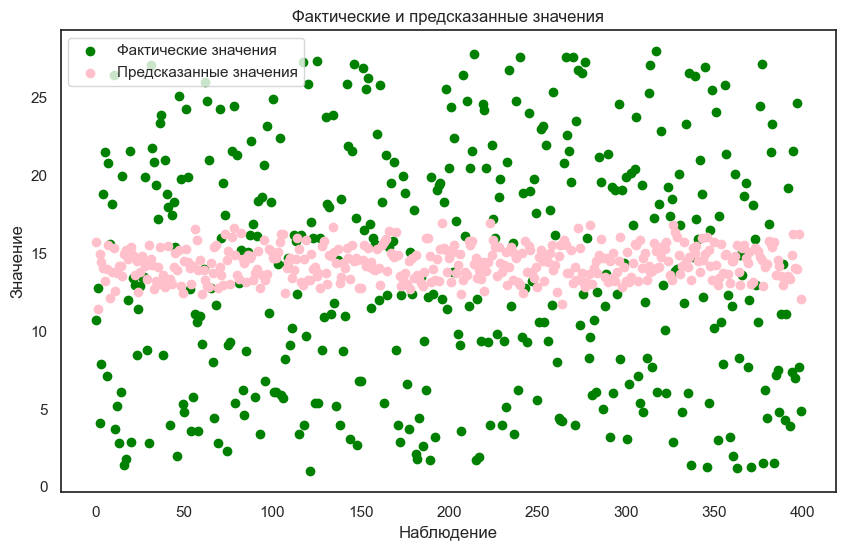

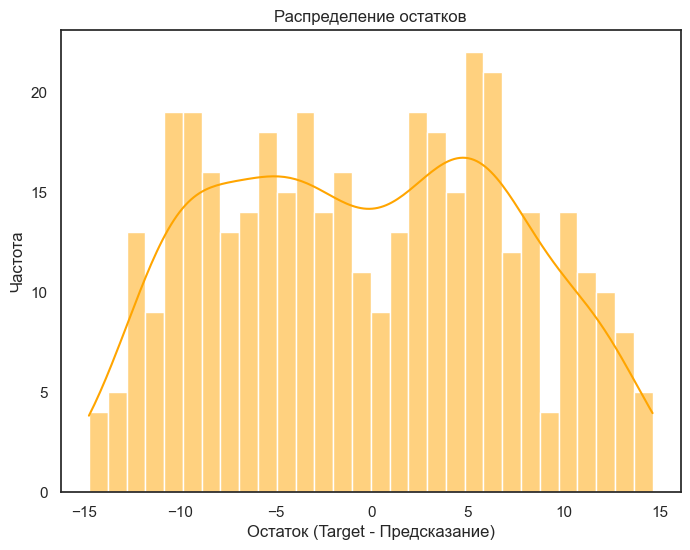

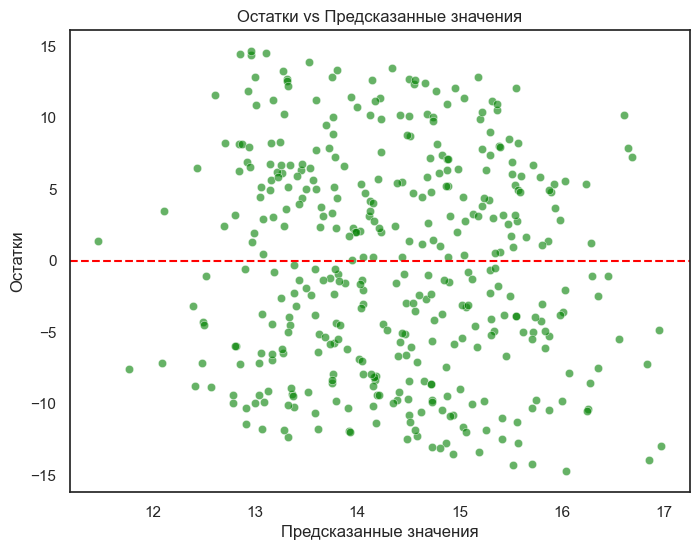

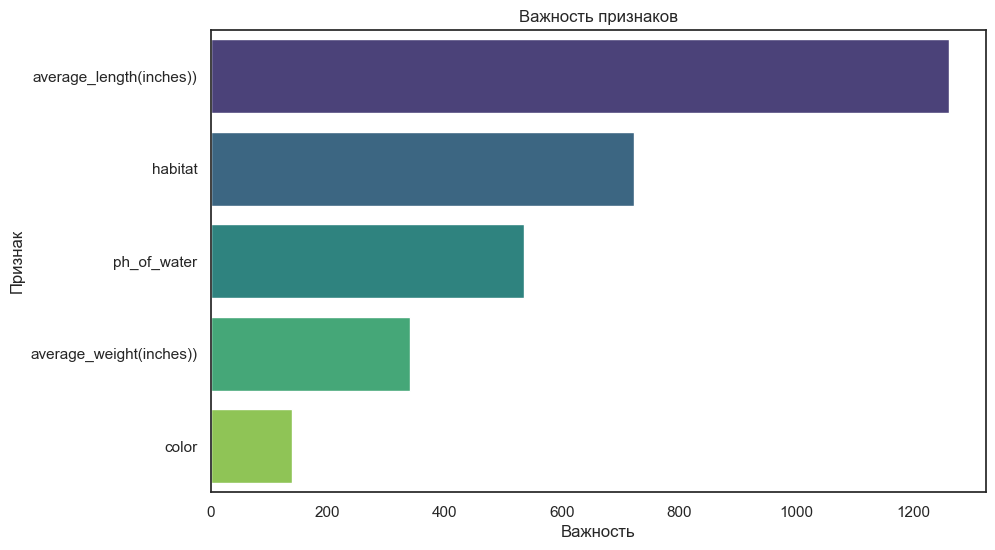

In [122]:
# Регрессор LGBM с определением параметров для подбора.
from sklearn.model_selection import GridSearchCV

# Разделение данных на обучающую и тестовую выборки
X_train_LGBM_GS, X_test_LGBM_GS, y_train_LGBM_GS, y_test_LGBM_GS = train_test_split(features, target, test_size=0.2, random_state=42)

# Определение модели
model_LGBM_GS = LGBMRegressor()

# Определение параметров для подбора
param_grid = {
    'num_leaves': [31, 50, 100],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 500],
    'max_depth': [-2, 10, 20]
}

# Подбор гиперпараметров с помощью GridSearchCV
grid_search = GridSearchCV(estimator=model_LGBM_GS, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train_LGBM_GS, y_train_LGBM_GS)

# Лучшие параметры
best_params_LGBM = grid_search.best_params_
print(f'Best parameters found: {best_params_LGBM}')

# Использование лучших параметров для обучения модели
best_model = LGBMRegressor(**best_params_LGBM)
best_model.fit(X_train_LGBM_GS, y_train_LGBM_GS)

# Предсказание на тестовой выборке
y_pred_LGBM_GS = best_model.predict(X_test_LGBM_GS)

# Вычисление метрик
mae_LGBM_GS = mean_absolute_error(y_test_LGBM_GS, y_pred_LGBM_GS)
mse_LGBM_GS = mean_squared_error(y_test_LGBM_GS, y_pred_LGBM_GS)
r2_LGBM_GS = r2_score(y_test_LGBM_GS, y_pred_LGBM_GS)

print(f'MAE_LGBM_GS: {mae_LGBM_GS}')
print(f'MSE_LGBM_GS: {mse_LGBM_GS}')
print(f'R²_LGBM_GS: {r2_LGBM_GS}')
print(f'MAE_LGBM: без подбора параметров: {mae_LGBM}')
print(f'MSE_LGBM: без подбора параметров: {mse_LGBM}')
print(f'R²_LGBM: без подбора параметров: {r2_LGBM}')


# Визуализация предсказанных и фактических значений
plt.figure(figsize=(10, 6))
plt.scatter(range(len(y_test_LGBM_GS)), y_test_LGBM_GS, color='green', label='Фактические значения')
plt.scatter(range(len(y_test_LGBM_GS)), y_pred_LGBM_GS, color='pink', label='Предсказанные значения')
plt.xlabel('Наблюдение')
plt.ylabel('Значение')
plt.title('Фактические и предсказанные значения')
plt.legend()
plt.show()

# График остатков
residuals_LGBM_GS = y_test_LGBM_GS - y_pred_LGBM_GS
plt.figure(figsize=(8, 6))
sns.histplot(residuals_LGBM_GS, kde=True, bins=30, color='orange')
plt.title('Распределение остатков')
plt.xlabel('Остаток (Target - Предсказание)')
plt.ylabel('Частота')
plt.show()

# Остатки vs Предсказанные значения
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_LGBM_GS, y=residuals_LGBM_GS, color='green', alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.title('Остатки vs Предсказанные значения')
plt.show()

# Важность признаков
importances_LGBM_GS = best_model.feature_importances_
indices_LGBM_GS = np.argsort(importances_LGBM_GS)[::-1]

# Названия признаков
feat_names = fish.columns[:-1].tolist()

plt.figure(figsize=(10, 6))
sns.barplot(x=importances_LGBM_GS[indices], y=np.array(feat_names)[indices], palette='viridis')
plt.title('Важность признаков')
plt.xlabel('Важность')
plt.ylabel('Признак')
plt.show()

In [89]:
print(f'MAE_LGBM_GS: {mae_LGBM_GS}')
print(f'MSE_LGBM_GS: {mse_LGBM_GS}')
print(f'R²_LGBM_GS: {r2_LGBM_GS}')
print(f'MAE_LGBM: без подбора параметров: {mae_LGBM}')
print(f'MSE_LGBM: без подбора параметров: {mse_LGBM}')
print(f'R²_LGBM: без подбора параметров: {r2_LGBM}')

MAE_LGBM_GS: 6.537840494520908
MSE_LGBM_GS: 56.909690764798604
R²_LGBM_GS: -0.008027505728900763
MAE_LGBM: без подбора параметров: 6.991762777862955
MSE_LGBM: без подбора параметров: 67.18787076753233
R²_LGBM: без подбора параметров: -0.19008240731689052


*****************
Метрики качества модели Extra Trees Regressor:
*****************
MAE_ETR: 6.7979
MSE_ETR: 64.0276
RMSE_ETR: 8.0017
R²_ETR: -0.1341


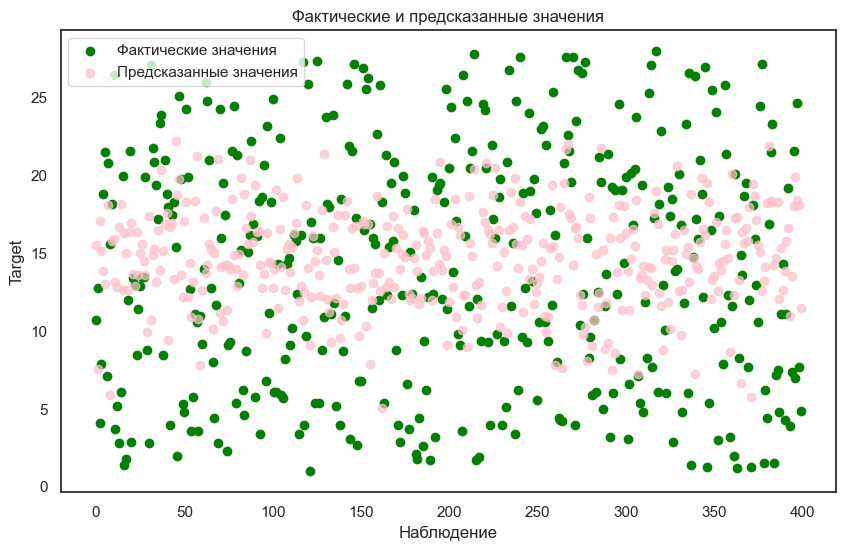

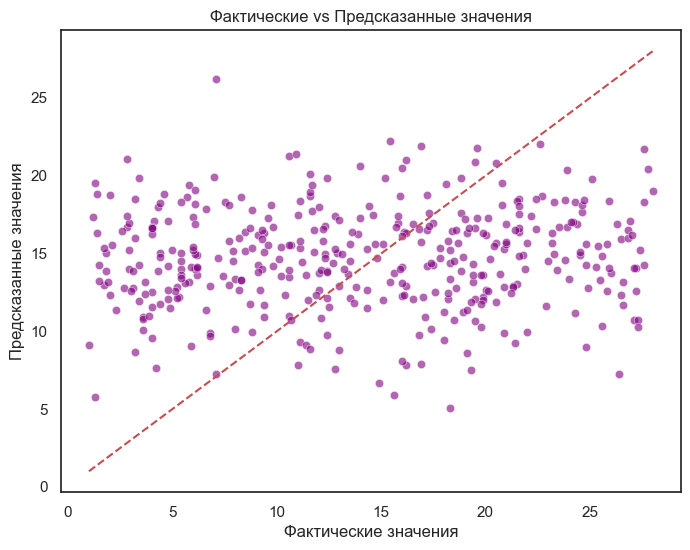

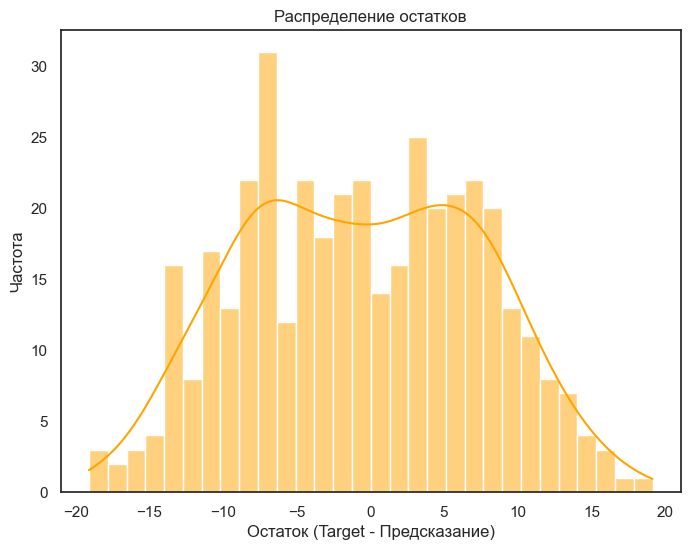

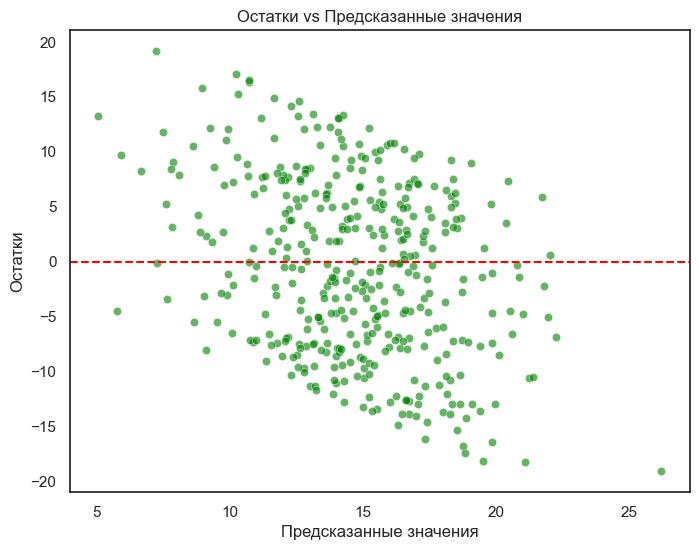

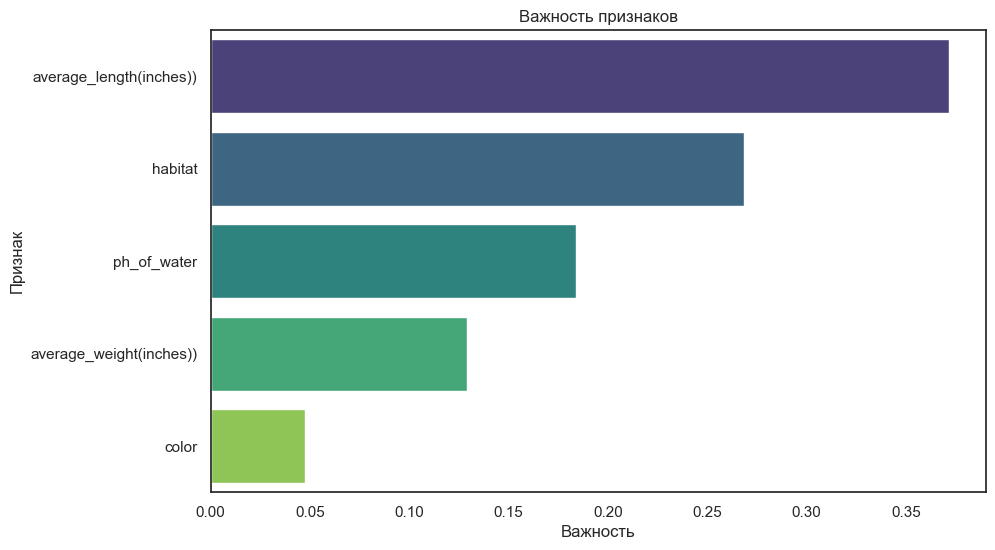

In [97]:
# ExtraTreesRegressor
from sklearn.model_selection import cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor

# Названия признаков
feat_names = fish.columns[:-1].tolist()


# Стандартизация признаков
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Разделение данных на обучающую и тестовую выборки
X_train_ETR, X_test_ETR, y_train_ETR, y_test_ETR = train_test_split(features_scaled, target, test_size=0.2, random_state=42)

# Создание и обучение модели Extra Trees Regressor
etr = ExtraTreesRegressor(
    n_estimators=100,
    random_state=42,
    n_jobs=-1)
etr.fit(X_train_ETR, y_train_ETR)

# Предсказание на тестовой выборке
y_pred_ETR = etr.predict(X_test_ETR)

# Вычисление метрик
mae_ETR = mean_absolute_error(y_test_ETR, y_pred_ETR)
mse_ETR = mean_squared_error(y_test_ETR, y_pred_ETR)
rmse_ETR = np.sqrt(mse_ETR)
r2_ETR = r2_score(y_test_ETR, y_pred_ETR)

print(f'*****************')
print(f'Метрики качества модели Extra Trees Regressor:')
print(f'*****************')
print(f'MAE_ETR: {mae_ETR:.4f}')
print(f'MSE_ETR: {mse_ETR:.4f}')
print(f'RMSE_ETR: {rmse_ETR:.4f}')
print(f'R²_ETR: {r2_ETR:.4f}')

# Визуализация предсказанных и фактических значений
plt.figure(figsize=(10, 6))
plt.scatter(range(len(y_test_ETR)), y_test_ETR, color='green', label='Фактические значения')
plt.scatter(range(len(y_test_ETR)), y_pred_ETR, color='pink', label='Предсказанные значения', alpha=0.7)
plt.xlabel('Наблюдение')
plt.ylabel('Target')
plt.title('Фактические и предсказанные значения')
plt.legend()
plt.show()

# Диаграмма предсказанных vs фактических значений
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_ETR, y=y_pred_ETR, color='purple', alpha=0.6)
plt.plot([y_test_ETR.min(), y_test_ETR.max()], [y_test_ETR.min(), y_test_ETR.max()], 'r--')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказанные значения')
plt.title('Фактические vs Предсказанные значения')
plt.show()

# График остатков
residuals = y_test_ETR - y_pred_ETR
plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True, bins=30, color='orange')
plt.title('Распределение остатков')
plt.xlabel('Остаток (Target - Предсказание)')
plt.ylabel('Частота')
plt.show()

# Остатки vs Предсказанные значения
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_ETR, y=residuals, color='green', alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.title('Остатки vs Предсказанные значения')
plt.show()

# Важность признаков
importances = etr.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
sns.barplot(x=importances[indices], y=np.array(feat_names)[indices], palette='viridis')
plt.title('Важность признаков')
plt.xlabel('Важность')
plt.ylabel('Признак')
plt.show()

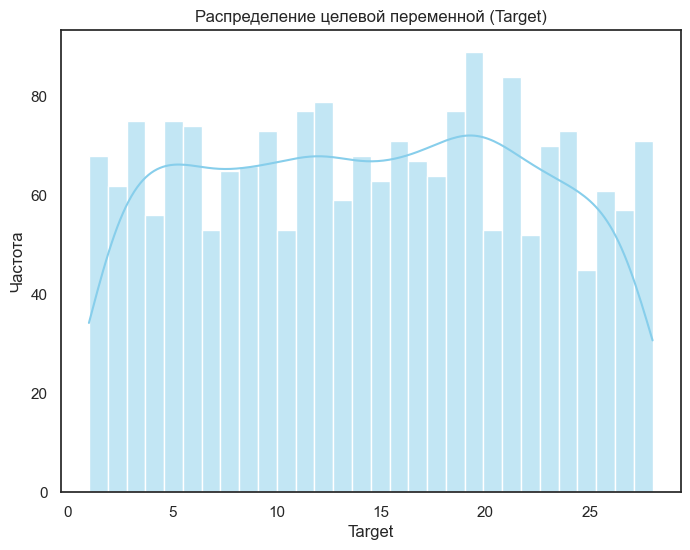

*****************
Метрики качества модели Random Forest Regressor:
*****************
MAE: 6.8140
MSE: 62.9835
RMSE: 7.9362
R²: -0.1156


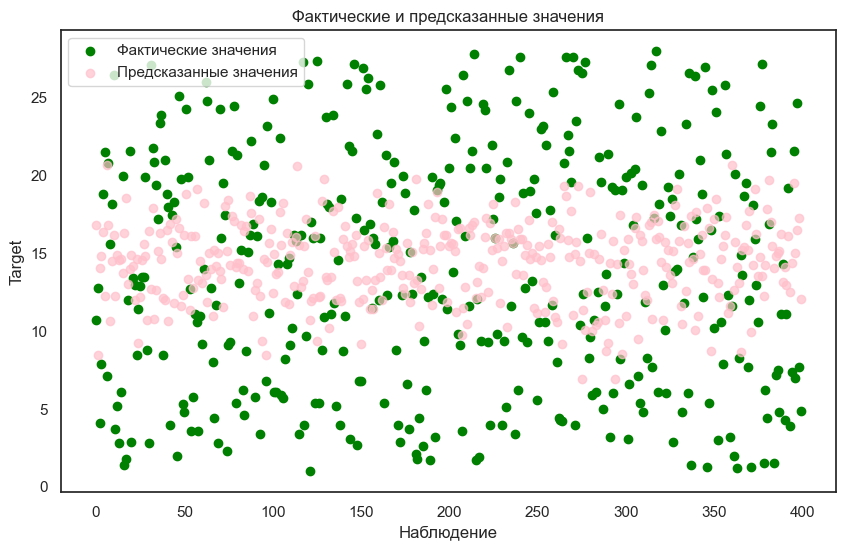

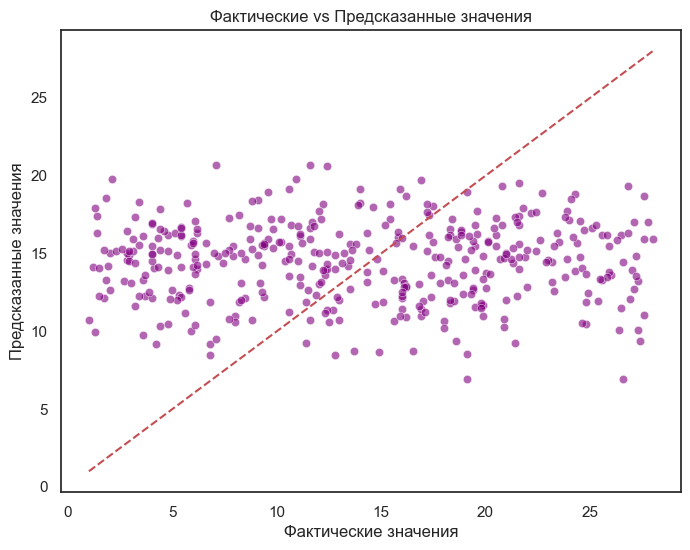

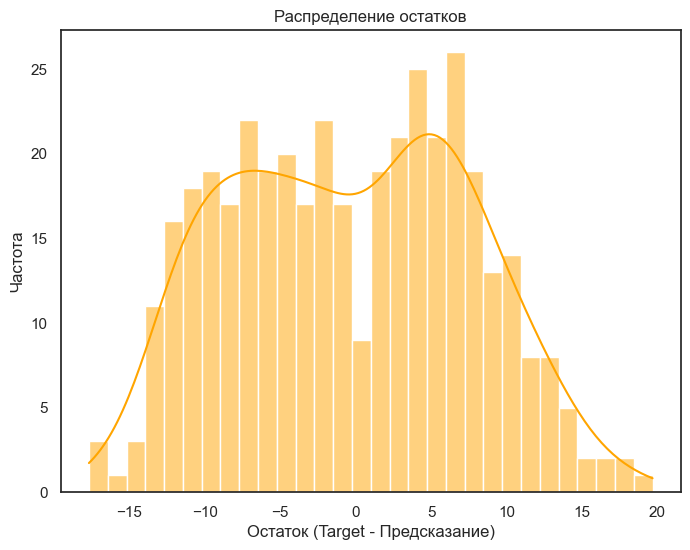

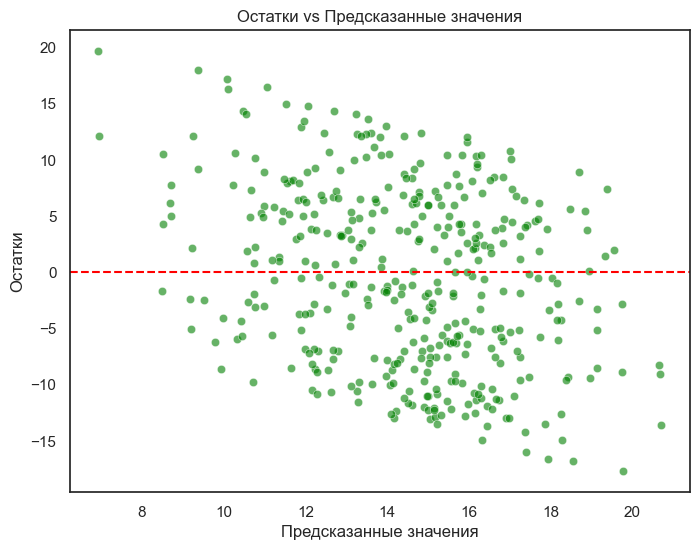

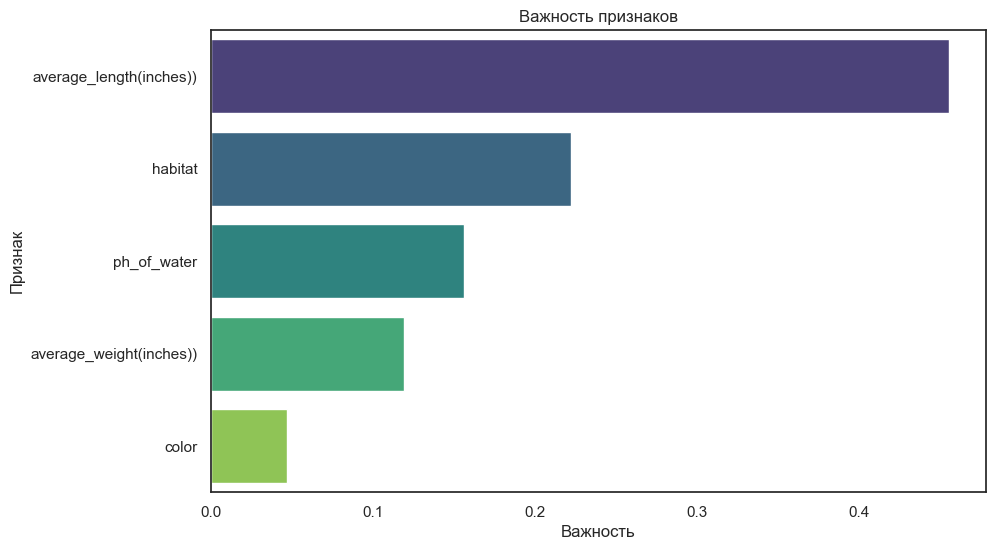

In [101]:
# RandomForestRegressor 
from sklearn.ensemble import RandomForestRegressor

# Визуализация распределения целевой переменной
plt.figure(figsize=(8, 6))
sns.histplot(target, kde=True, bins=30, color='skyblue')
plt.title('Распределение целевой переменной (Target)')
plt.xlabel('Target')
plt.ylabel('Частота')
plt.show()

scaler = StandardScaler()
X_scaled_RF = scaler.fit_transform(features)

# Разделение данных на обучающую и тестовую выборки
X_train_RF, X_test_RF, y_train_RF, y_test_RF = train_test_split(
    X_scaled_RF, target, test_size=0.2, random_state=42)

# Создание и обучение модели Random Forest Regressor
rfr = RandomForestRegressor(
    n_estimators=100,
    random_state=42,
    n_jobs=-1)
rfr.fit(X_train_RF, y_train_RF)

# Предсказание на тестовой выборке
y_pred_RF = rfr.predict(X_test_RF)

# Вычисление метрик
mae_RF = mean_absolute_error(y_test_RF, y_pred_RF)
mse_RF = mean_squared_error(y_test_RF, y_pred_RF)
rmse_RF = np.sqrt(mse_RF)
r2_RF = r2_score(y_test_RF, y_pred_RF)

print(f'*****************')
print(f'Метрики качества модели Random Forest Regressor:')
print(f'*****************')
print(f'MAE: {mae_RF:.4f}')
print(f'MSE: {mse_RF:.4f}')
print(f'RMSE: {rmse_RF:.4f}')
print(f'R²: {r2_RF:.4f}')

# Визуализация предсказанных и фактических значений
plt.figure(figsize=(10, 6))
plt.scatter(range(len(y_test_RF)), y_test_RF, color='green', label='Фактические значения')
plt.scatter(range(len(y_test_RF)), y_pred_RF, color='pink', label='Предсказанные значения', alpha=0.7)
plt.xlabel('Наблюдение')
plt.ylabel('Target')
plt.title('Фактические и предсказанные значения')
plt.legend()
plt.show()

# Диаграмма предсказанных vs фактических значений
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test_RF, y=y_pred_RF, color='purple', alpha=0.6)
plt.plot([y_test_RF.min(), y_test_RF.max()], [y_test_RF.min(), y_test_RF.max()], 'r--')
plt.xlabel('Фактические значения')
plt.ylabel('Предсказанные значения')
plt.title('Фактические vs Предсказанные значения')
plt.show()

# График остатков
residuals_RF = y_test_RF - y_pred_RF
plt.figure(figsize=(8, 6))
sns.histplot(residuals_RF, kde=True, bins=30, color='orange')
plt.title('Распределение остатков')
plt.xlabel('Остаток (Target - Предсказание)')
plt.ylabel('Частота')
plt.show()

# Остатки vs Предсказанные значения
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_RF, y=residuals_RF, color='green', alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.title('Остатки vs Предсказанные значения')
plt.show()

# Важность признаков
importances_RF = rfr.feature_importances_
indices_RF = np.argsort(importances_RF)[::-1]

plt.figure(figsize=(10, 6))
sns.barplot(x=importances_RF[indices], y=np.array(feat_names)[indices], palette='viridis')
plt.title('Важность признаков')
plt.xlabel('Важность')
plt.ylabel('Признак')
plt.show()


Mean Squared Error (MSE): 56.54
R-squared (R^2): -0.00


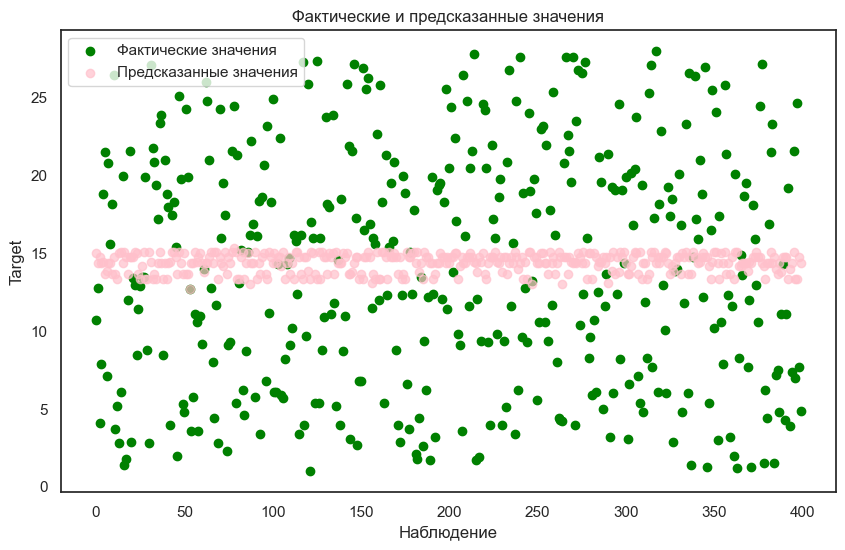

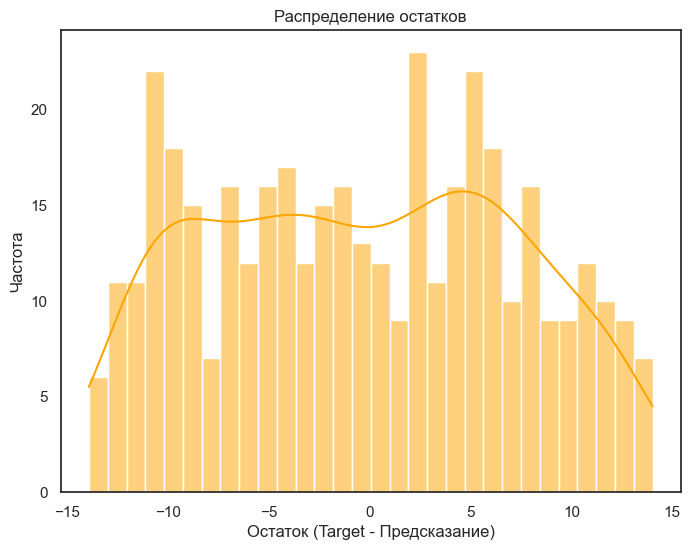

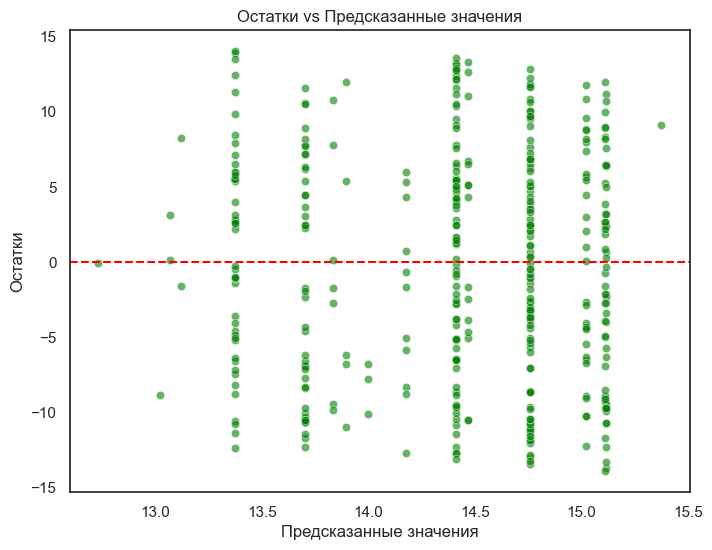

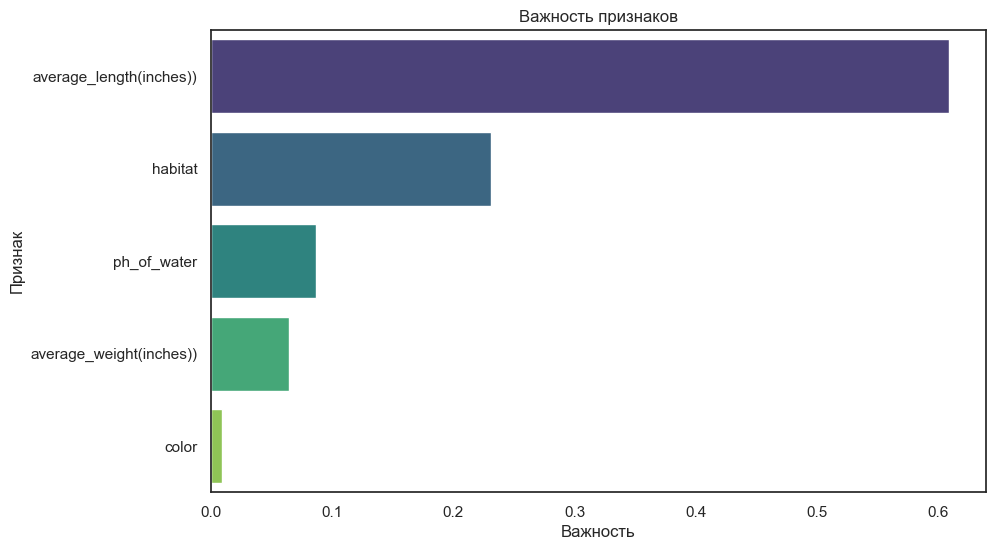

In [123]:
#AdaBoostRegressor
from sklearn.ensemble import AdaBoostRegressor

# Разделение данных на обучающий и тестовый наборы
X_train_Ada, X_test_Ada, y_train_Ada, y_test_Ada = train_test_split(features, target, test_size=0.2, random_state=42)

# Создание и обучение модели AdaBoostRegressor
regressor_Ada = AdaBoostRegressor(n_estimators=100, random_state=42)
regressor_Ada.fit(X_train_Ada, y_train_Ada)

# Выполнение предсказаний на тестовых данных
y_pred_Ada = regressor_Ada.predict(X_test_Ada)

# Вычисление метрик
mse_Ada = mean_squared_error(y_test_Ada, y_pred_Ada)
r2_Ada = r2_score(y_test_Ada, y_pred_Ada)

print(f"Mean Squared Error (MSE): {mse_Ada:.2f}")
print(f"R-squared (R^2): {r2_Ada:.2f}")

# Визуализация результатов
plt.figure(figsize=(10, 6))
plt.scatter(range(len(y_test_Ada)), y_test_Ada, color='green', label='Фактические значения')
plt.scatter(range(len(y_test_Ada)), y_pred_Ada, color='pink', label='Предсказанные значения', alpha=0.7)
plt.xlabel('Наблюдение')
plt.ylabel('Target')
plt.title('Фактические и предсказанные значения')
plt.legend()
plt.show()

# График остатков
residuals_Ada = y_test_Ada - y_pred_Ada
plt.figure(figsize=(8, 6))
sns.histplot(residuals_Ada, kde=True, bins=30, color='orange')
plt.title('Распределение остатков')
plt.xlabel('Остаток (Target - Предсказание)')
plt.ylabel('Частота')
plt.show()

# Остатки vs Предсказанные значения
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_Ada, y=residuals_Ada, color='green', alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.title('Остатки vs Предсказанные значения')
plt.show()

# Важность признаков
importances_Ada = regressor_Ada.feature_importances_
indices_Ada = np.argsort(importances_Ada)[::-1]

# Названия признаков
feat_names = fish.columns[:-1].tolist()

plt.figure(figsize=(10, 6))
sns.barplot(x=importances_Ada[indices], y=np.array(feat_names)[indices], palette='viridis')
plt.title('Важность признаков')
plt.xlabel('Важность')
plt.ylabel('Признак')
plt.show()

Mean Squared Error (MSE): 56.5015947310100444
R-squared (R^2): -0.0007989999769034


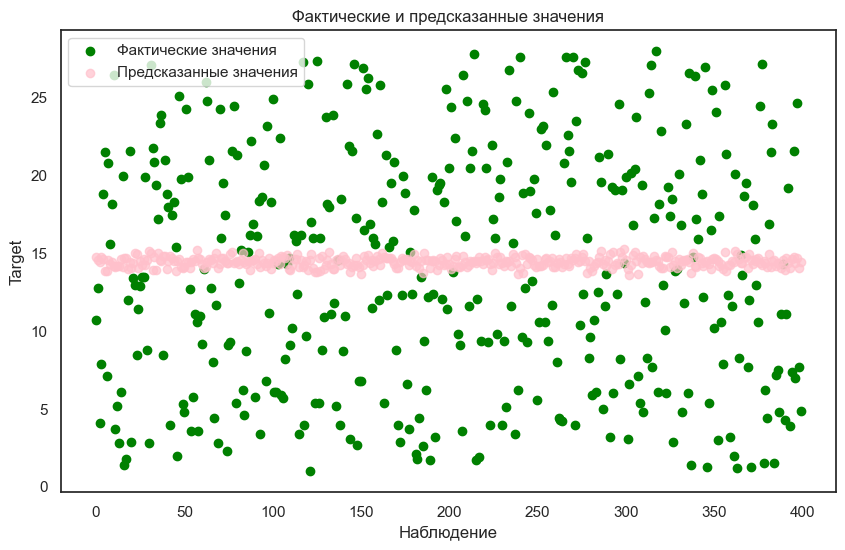

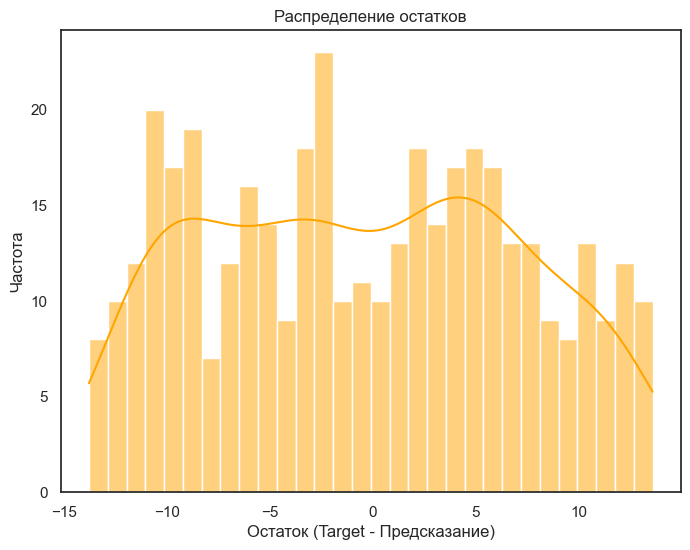

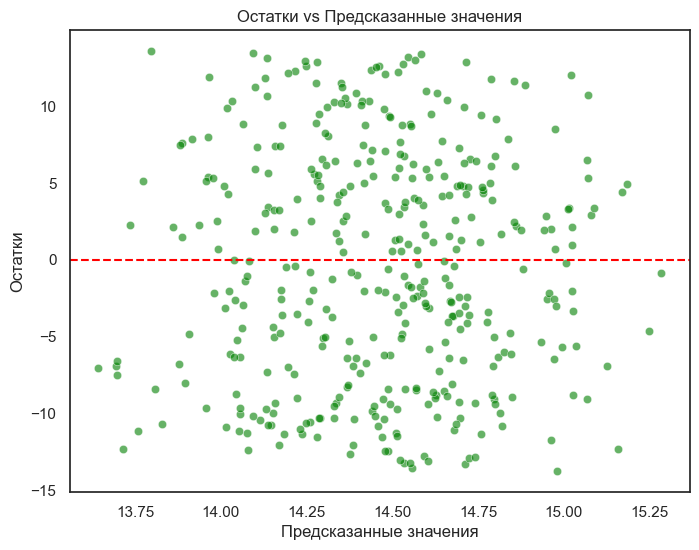

In [127]:
# Лассо
from sklearn.linear_model import Lasso

# Разделение данных на обучающий и тестовый наборы
X_train_lasso, X_test_lasso, y_train_lasso, y_test_lasso = train_test_split(features, target, test_size=0.2, random_state=42)

# Создание и обучение модели регрессии Lasso
regressor_Lasso = Lasso(alpha=0.05)  # Здесь alpha - гиперпараметр регуляризации L1
regressor_Lasso.fit(X_train_lasso, y_train_lasso)

# Выполнение предсказаний на тестовых данных
y_pred_Lasso = regressor_Lasso.predict(X_test_lasso)

# Вычисление метрик
mse_Lasso = mean_squared_error(y_test_lasso, y_pred_Lasso)
r2_Lasso = r2_score(y_test_lasso, y_pred_Lasso)

print(f"Mean Squared Error (MSE): {mse_Lasso:.16f}")
print(f"R-squared (R^2): {r2_Lasso:.16f}")

# Визуализация результатов
plt.figure(figsize=(10, 6))
plt.scatter(range(len(y_test_lasso)), y_test_lasso, color='green', label='Фактические значения')
plt.scatter(range(len(y_test_lasso)), y_pred_Lasso, color='pink', label='Предсказанные значения', alpha=0.7)
plt.xlabel('Наблюдение')
plt.ylabel('Target')
plt.title('Фактические и предсказанные значения')
plt.legend()
plt.show()

# График остатков
residuals_lasso = y_test_lasso - y_pred_Lasso
plt.figure(figsize=(8, 6))
sns.histplot(residuals_lasso, kde=True, bins=30, color='orange')
plt.title('Распределение остатков')
plt.xlabel('Остаток (Target - Предсказание)')
plt.ylabel('Частота')
plt.show()

# Остатки vs Предсказанные значения
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_Lasso, y=residuals_lasso, color='green', alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.title('Остатки vs Предсказанные значения')
plt.show()


*****************
Метрики качества модели Bayesian Ridge Regression:
*****************
MAE: 6.52
MSE: 56.62
RMSE: 7.52
R²: -0.00

Средние метрики по кросс-валидации (5 фолдов):
MAE: 6.66 ± 0.09
MSE: 59.41 ± 1.44
R²: -0.00 ± 0.00


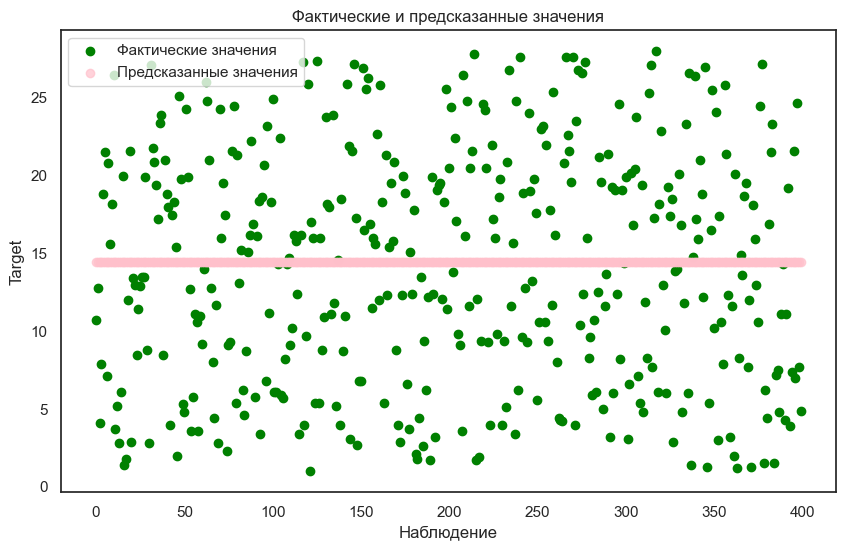

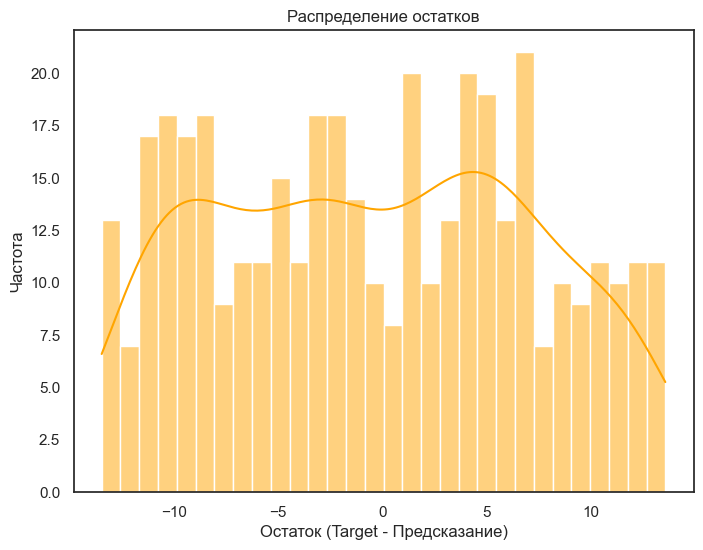

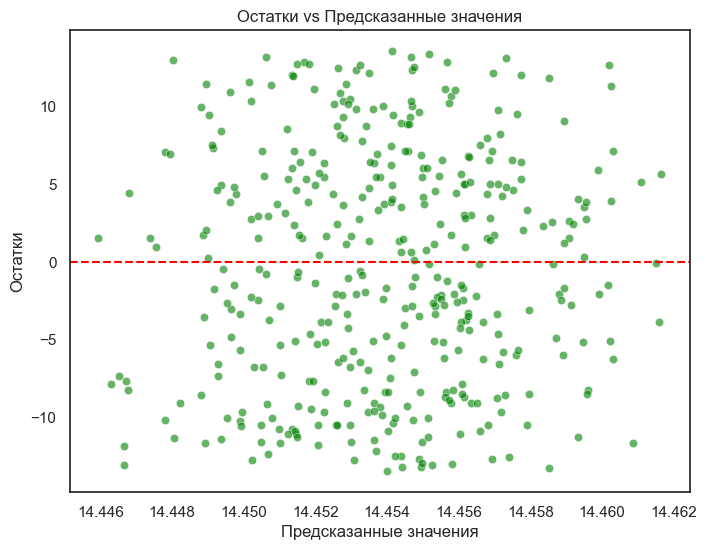

In [129]:
# Bayesian Ridge Regression
from sklearn.linear_model import BayesianRidge

# Стандартизация признаков
scaler_Ri = StandardScaler()
X_scaled_Ri = scaler.fit_transform(features)

# Разделение данных на обучающую и тестовую выборки
X_train_Ri, X_test_Ri, y_train_Ri, y_test_Ri = train_test_split(X_scaled_Ri, target, test_size=0.2, random_state=42)

# Создание и обучение модели Bayesian Ridge Regression
bayesian_ridge = BayesianRidge()
bayesian_ridge.fit(X_train_Ri, y_train_Ri)

# Предсказание на тестовой выборке
y_pred_Ri = bayesian_ridge.predict(X_test_Ri)

# Вычисление метрик
mse_Ri = mean_squared_error(y_test_Ri, y_pred_Ri)
rmse_Ri = np.sqrt(mse_Ri)
mae_Ri = mean_absolute_error(y_test_Ri, y_pred_Ri)
r2_Ri = r2_score(y_test_Ri, y_pred_Ri)

print(f'*****************')
print(f'Метрики качества модели Bayesian Ridge Regression:')
print(f'*****************')
print(f'MAE: {mae_Ri:.2f}')
print(f'MSE: {mse_Ri:.2f}')
print(f'RMSE: {rmse_Ri:.2f}')
print(f'R²: {r2_Ri:.2f}')

# Кросс-валидация
scoring = ['neg_mean_absolute_error', 'neg_mean_squared_error', 'r2']
cv_results_Ri = cross_validate(
    bayesian_ridge, X_scaled_Ri, target, cv=5, scoring=scoring, n_jobs=-1)

# Преобразование отрицательных метрик в положительные
mae_cv_Ri = -cv_results_Ri['test_neg_mean_absolute_error']
mse_cv_Ri = -cv_results_Ri['test_neg_mean_squared_error']
r2_cv_Ri = cv_results_Ri['test_r2']

print('\nСредние метрики по кросс-валидации (5 фолдов):')
print(f'MAE: {mae_cv_Ri.mean():.2f} ± {mae_cv_Ri.std():.2f}')
print(f'MSE: {mse_cv_Ri.mean():.2f} ± {mse_cv_Ri.std():.2f}')
print(f'R²: {r2_cv_Ri.mean():.2f} ± {r2_cv_Ri.std():.2f}')

# Визуализация результатов
plt.figure(figsize=(10, 6))
plt.scatter(range(len(y_test_Ri)), y_test_Ri, color='green', label='Фактические значения')
plt.scatter(range(len(y_test_Ri)), y_pred_Ri, color='pink', label='Предсказанные значения', alpha=0.7)
plt.xlabel('Наблюдение')
plt.ylabel('Target')
plt.title('Фактические и предсказанные значения')
plt.legend()
plt.show()

# График остатков
residuals_Ri = y_test_Ri - y_pred_Ri
plt.figure(figsize=(8, 6))
sns.histplot(residuals_Ri, kde=True, bins=30, color='orange')
plt.title('Распределение остатков')
plt.xlabel('Остаток (Target - Предсказание)')
plt.ylabel('Частота')
plt.show()

# Остатки vs Предсказанные значения
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_Ri, y=residuals_Ri, color='green', alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.title('Остатки vs Предсказанные значения')
plt.show()

MAE: 7.02766154907621
MSE: 67.02478100830385
R²: -0.1871936380933068


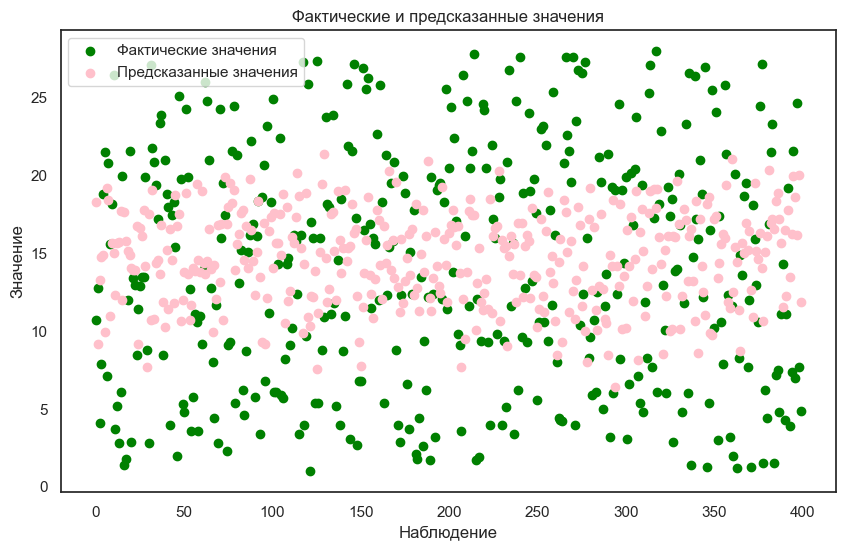

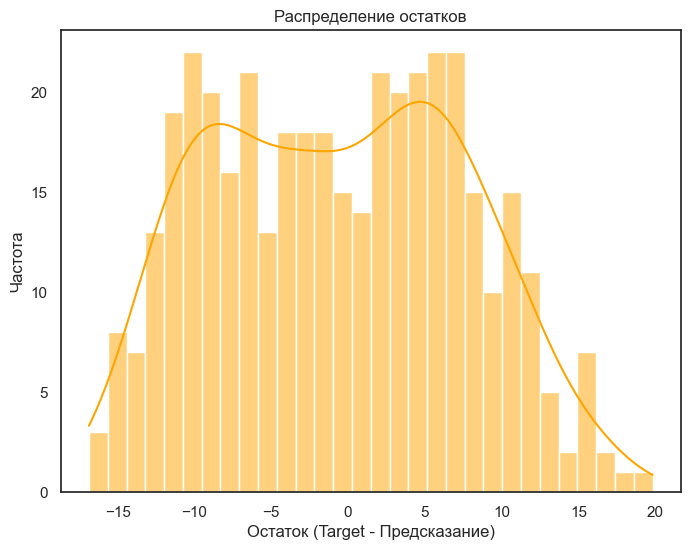

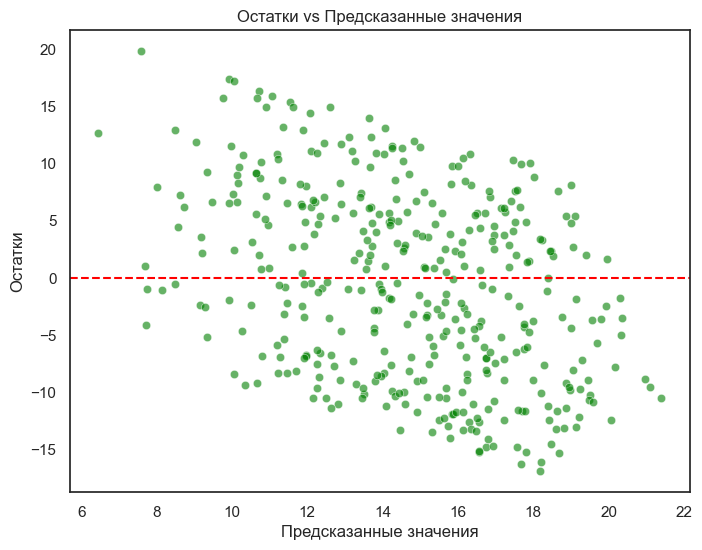

In [131]:
# Ансамбль моделей
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

# Разделение данных на обучающую и тестовую выборки
X_train_ens, X_test_ens, y_train_ens, y_test_ens = train_test_split(features, target, test_size=0.2, random_state=42)

# Определение базовых регрессоров
regressor1 = LinearRegression()
regressor2 = DecisionTreeRegressor(random_state=42)
regressor3 = RandomForestRegressor(n_estimators=100, random_state=42)
regressor4 = XGBRegressor()

# Определение ансамбля регрессоров (VotingRegressor)
voting_regressor = VotingRegressor(estimators=[
    ('lr', regressor1),
    ('dt', regressor2),
    ('rf', regressor3),
    ('xgb', regressor4)])

# Обучение ансамбля регрессоров
voting_regressor.fit(X_train_ens, y_train_ens)

# Предсказание на тестовой выборке
y_pred_ens = voting_regressor.predict(X_test_ens)

# Вычисление метрик
mae_ens = mean_absolute_error(y_test_ens, y_pred_ens)
mse_ens = mean_squared_error(y_test_ens, y_pred_ens)
r2_ens = r2_score(y_test_ens, y_pred_ens)

print(f'MAE: {mae_ens}')
print(f'MSE: {mse_ens}')
print(f'R²: {r2_ens}')

# Визуализация предсказанных и фактических значений
plt.figure(figsize=(10, 6))
plt.scatter(range(len(y_test_ens)), y_test_ens, color='green', label='Фактические значения')
plt.scatter(range(len(y_test_ens)), y_pred_ens, color='pink', label='Предсказанные значения')
plt.xlabel('Наблюдение')
plt.ylabel('Значение')
plt.title('Фактические и предсказанные значения')
plt.legend()
plt.show()


# График остатков
residuals_ens = y_test_ens - y_pred_ens
plt.figure(figsize=(8, 6))
sns.histplot(residuals_ens, kde=True, bins=30, color='orange')
plt.title('Распределение остатков')
plt.xlabel('Остаток (Target - Предсказание)')
plt.ylabel('Частота')
plt.show()

# Остатки vs Предсказанные значения
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_ens, y=residuals_ens, color='green', alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.title('Остатки vs Предсказанные значения')
plt.show()

Поиск аномалий

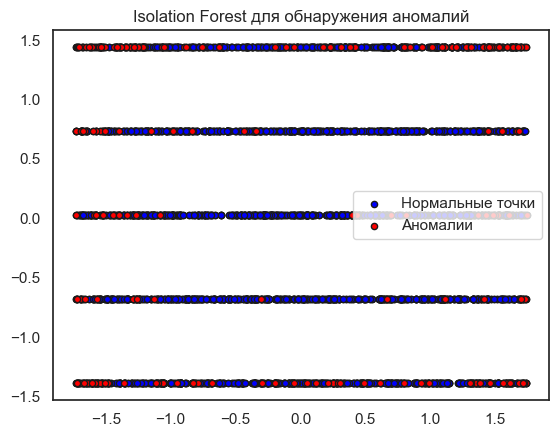

In [113]:
from sklearn.ensemble import IsolationForest

# Стандартизация признаков
scaler_IF = StandardScaler()
X_scaled_IF = scaler.fit_transform(features)

# Построение модели Isolation Forest
clf = IsolationForest(contamination=0.1, random_state=42)
clf.fit(X_scaled_IF)
y_pred_IF = clf.predict(X_scaled_IF)

# Отображение результатов
plt.title("Isolation Forest для обнаружения аномалий")
plt.scatter(X_scaled_IF[:, 0], X_scaled_IF[:, 1], c='white', s=20, edgecolor='k')

# Отображение нормальных точек
normal_points_IF = X_scaled_IF[y_pred_IF == 1]
plt.scatter(normal_points_IF[:, 0], normal_points_IF[:, 1], c='blue', s=20, edgecolor='k', label="Нормальные точки")

# Отображение аномалий
anomalies_IF = X_scaled_IF[y_pred_IF == -1]
plt.scatter(anomalies_IF[:, 0], anomalies_IF[:, 1], c='red', s=20, edgecolor='k', label="Аномалии")

plt.legend()
plt.show()


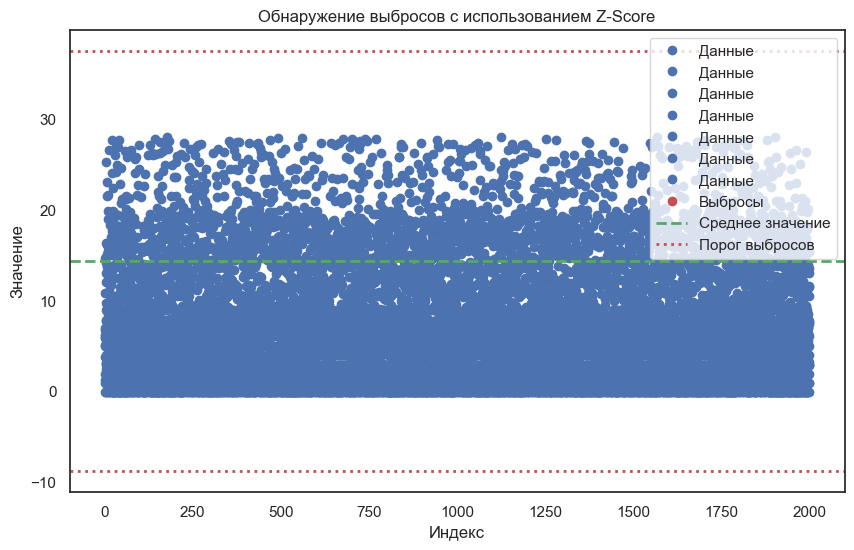

Найденные выбросы: []


In [115]:
# Вычисление Z-оценок
mean_Z = np.mean(target)
std_dev_Z = np.std(target)
z_scores = [(x - mean_Z) / std_dev_Z for x in target]

# Определение порога для выбросов
threshold = 3

# Поиск выбросов
outliers = np.where(np.abs(z_scores) > threshold)

# Визуализация данных и выбросов
plt.figure(figsize=(10, 6))
plt.plot(fish, 'bo', label='Данные')
plt.plot(outliers[0], target[outliers], 'ro', label='Выбросы')
plt.axhline(mean_Z, color='g', linestyle='dashed', linewidth=2, label='Среднее значение')
plt.axhline(mean_Z + threshold * std_dev_Z, color='r', linestyle='dotted', linewidth=2, label='Порог выбросов')
plt.axhline(mean_Z - threshold * std_dev_Z, color='r', linestyle='dotted', linewidth=2)

plt.title('Обнаружение выбросов с использованием Z-Score')
plt.xlabel('Индекс')
plt.ylabel('Значение')
plt.legend()
plt.show()

# Вывод найденных выбросов
print("Найденные выбросы:", target[outliers])
